<a href="https://colab.research.google.com/github/TatsianaPoto/ktest/blob/main/k_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**План:**

**EDA** - Анализ данных
 - Отображение распределений числовых и категориальных переменных
 - Есть ли несоответствия?
 - Правильно ли закодированы переменные?

**Предварительная обработка** - очистка данных
 - Пропущенные значения
 - Выбросы
 - Категориальные значения (уникальные значения, кодировка)
 - Кодирование признаков one hot encoding and label encoding

**Разработка и выбор характеристик** - что можно улучшить?
 - Корреляцию с целевой переменной
 - Мультиколлинеальность

**Время обучения** - построение и сравнение моделей
 - Сравнение различных алгоритмов
 - Создание конвейера scikit learn для предварительной обработки
 - Обучение модели и метрики
 ## Algorithms
 - from sklearn.neighbors import KNeighborsClassifier
 - from sklearn.svm import SVC
 - from sklearn.ensemble import RandomForestClassifier
 - from sklearn.ensemble import AdaBoostClassifier
 - from sklearn.ensemble import GradientBoostingClassifier
 - from sklearn.neural_network import MLPClassifier
 - Использование gridsearch/randomsearch для настройки параметров

**Оценка модели и выводы**
 - Оценка с помощью метрик
 - from sklearn.metrics import accuracy_score,
 - log_loss,
 - classification_report,
 - roc_auc_score, plot_roc_curve

In [1]:
from google.colab import files

# import for EDA
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None) # show all columns
pd.set_option('display.max_rows', None) # show all rows
import matplotlib as plt
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Visualization
from sklearn.metrics import confusion_matrix
import missingno as msno

## ML
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, log_loss, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


## Algorithms
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

In [2]:
#pip install --upgrade scikit-learn

Загрузка данных

In [3]:
uploaded = files.upload()

Saving combined_output.txt to combined_output (1).txt


In [4]:
# Предварительно, при помощи combine_files.py объединила файлы и проверила на дубликаты
data = pd.read_csv('combined_output.txt', delimiter=',', header=None)

In [5]:
# 21 колонка 5 тыс значений, посмотрим на первые 5
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
0,MI,112,510,420-1383,no,no,0,243.4,77,41.38,182.1,97,15.48,259.2,94,11.66,12.8,2,3.46,1,False.
1,NH,8,415,421-6168,no,no,0,176.0,97,29.92,234.2,136,19.91,193.5,134,8.71,8.5,5,2.30,1,False.
2,MD,86,408,329-2789,no,no,0,226.3,88,38.47,223.0,107,18.96,255.6,92,11.50,13.0,3,3.51,4,False.
3,MO,112,510,409-1244,no,yes,36,113.7,117,19.33,157.5,82,13.39,177.6,118,7.99,10.0,3,2.70,2,False.
4,IA,46,510,380-5873,no,no,0,199.2,111,33.86,175.1,83,14.88,210.6,84,9.48,10.2,2,2.75,3,False.


In [6]:
# Проверим типы данных
print('Данные и типы:\n{}'.format(data.dtypes))

Данные и типы:
0      object
1       int64
2       int64
3      object
4      object
5      object
6       int64
7     float64
8       int64
9     float64
10    float64
11      int64
12    float64
13    float64
14      int64
15    float64
16    float64
17      int64
18    float64
19      int64
20     object
dtype: object


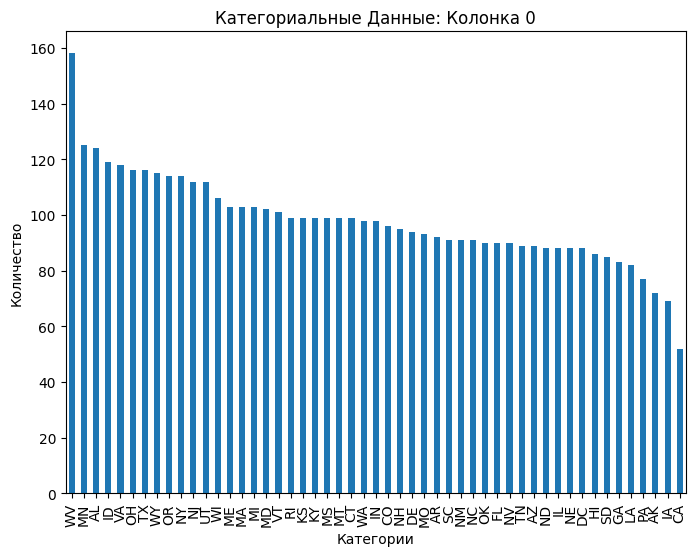

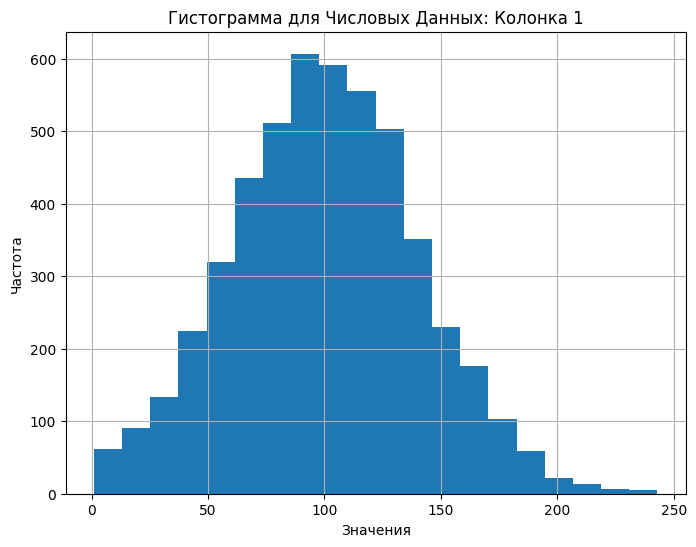

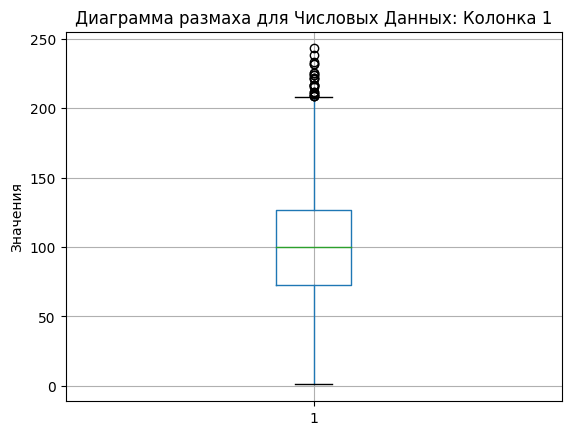

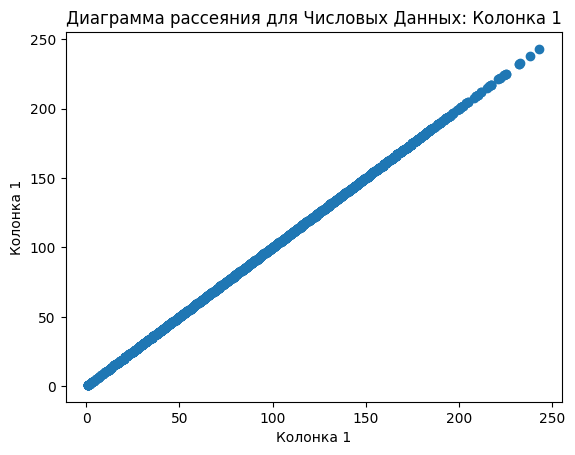

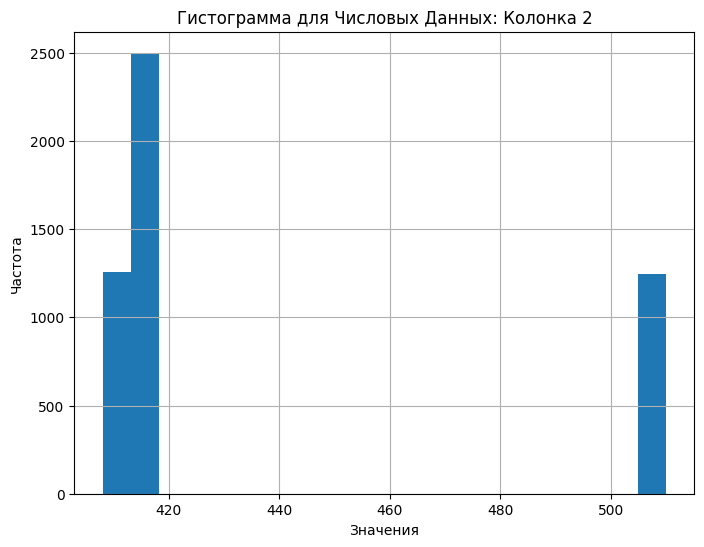

...

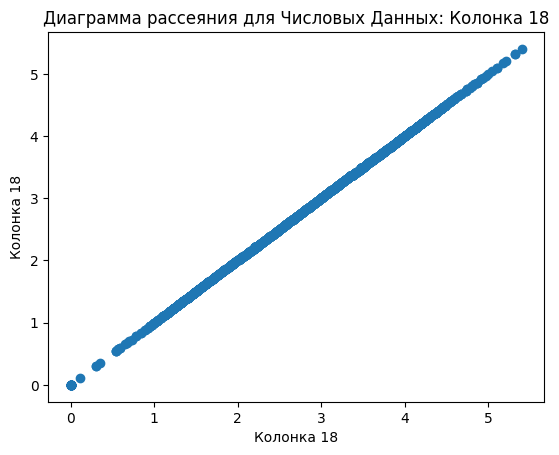

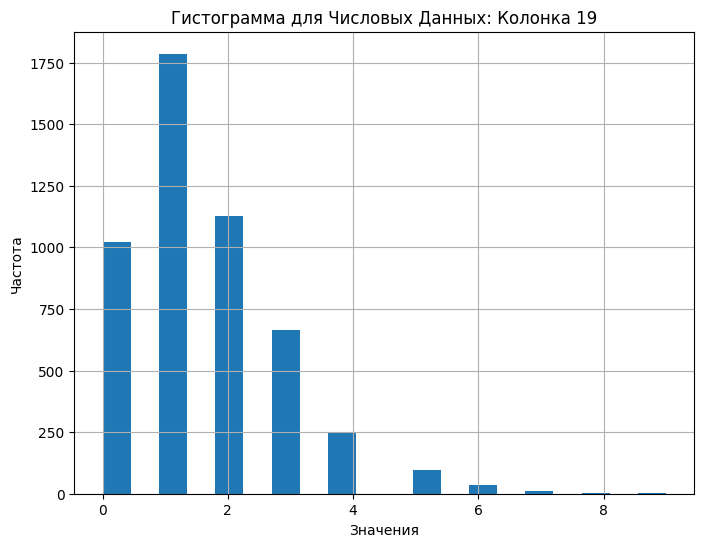

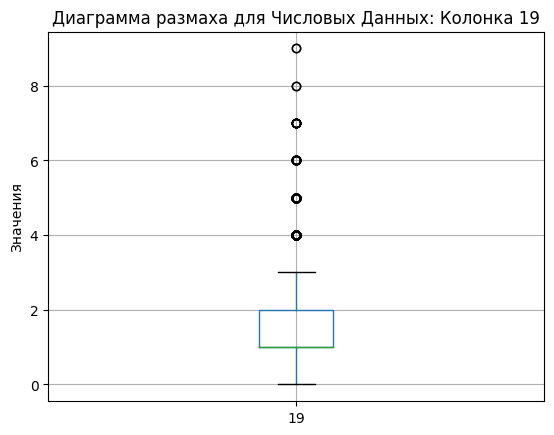

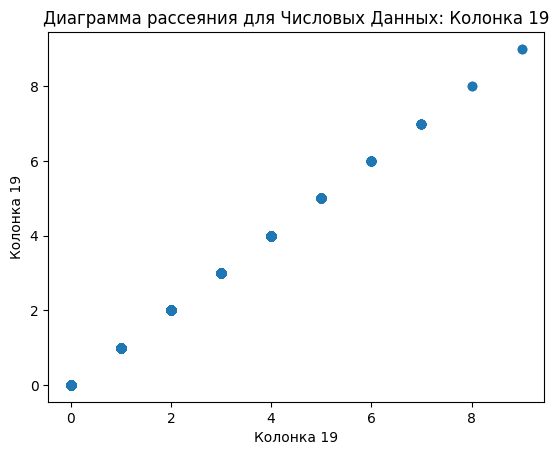

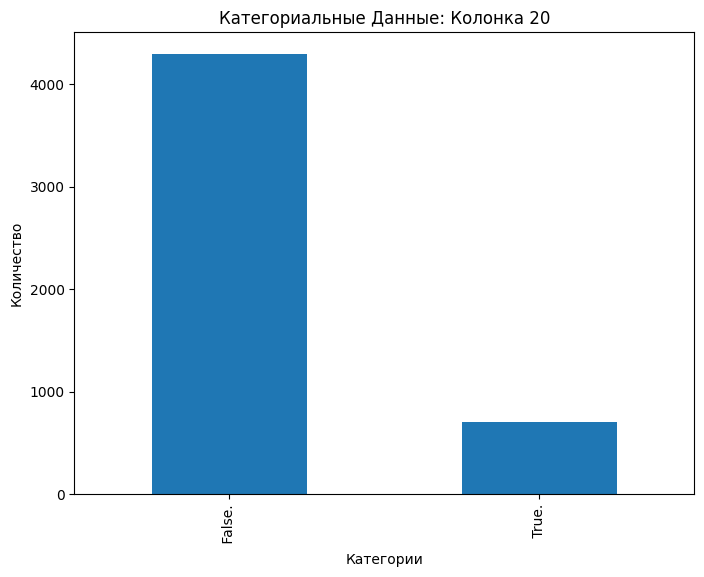

In [7]:
def visualize_data(data_path):
    # Загрузка данных
    data = pd.read_csv(data_path, delimiter=',', header=None)

    # Итерация по колонкам
    for col_idx, col_type in data.dtypes.iteritems():
        plt.figure(figsize=(8, 6))

        # Для категориальных данных
        if col_type == 'object':
            data[col_idx].value_counts().plot(kind='bar')
            plt.xlabel('Категории')
            plt.ylabel('Количество')
            plt.title(f'Категориальные Данные: Колонка {col_idx}')

        # Для числовых данных
        elif col_type in ['int64', 'float64']:
            data[col_idx].hist(bins=20)
            plt.xlabel('Значения')
            plt.ylabel('Частота')
            plt.title(f'Гистограмма для Числовых Данных: Колонка {col_idx}')
            plt.show()

            data.boxplot(column=col_idx)
            plt.ylabel('Значения')
            plt.title(f'Диаграмма размаха для Числовых Данных: Колонка {col_idx}')
            plt.show()

            plt.scatter(data[col_idx], data[col_idx])
            plt.xlabel(f'Колонка {col_idx}')
            plt.ylabel(f'Колонка {col_idx}')
            plt.title(f'Диаграмма рассеяния для Числовых Данных: Колонка {col_idx}')

        # Для булевых данных
        elif col_type == 'bool':
            data[col_idx].value_counts().plot(kind='pie', autopct='%1.1f%%')
            plt.title(f'Круговая Диаграмма для Булевых Данных: Колонка {col_idx}')

        plt.show()

visualize_data('combined_output.txt')


In [8]:
# Посмотрим на статистику
data.describe()

,1,2,6,7,8,9,10,11,12,13,14,15,16,17,18,19
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,436.911400,7.755200,180.288900,100.029400,30.649668,200.636560,100.191000,17.054322,200.391620,99.919200,9.017732,10.261780,4.435200,2.771196,1.570400
std,39.69456,42.209182,13.546393,53.894699,19.831197,9.162069,50.551309,19.826496,4.296843,50.527789,19.958686,2.273763,2.761396,2.456788,0.745514,1.306363
min,1.00000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,408.000000,0.000000,143.700000,87.000000,24.430000,166.375000,87.000000,14.140000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000
50%,100.00000,415.000000,0.000000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.00000,415.000000,17.000000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.00000,510.000000,52.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


Обратимся к файлу churn.names.txt в котором находится описание полей и их тип:

0 state - штат: discrete.

1 account length - длина счета: continuous.

2 area code - код города: continuous.

3 phone number - номер телефона: discrete.

4 international plan: discrete - международный тарифный план.

5 voice mail plan: discrete - план голосовой почты.

6 number vmail messages - количество сообщений голосовой почты: continuous.

7 total day minutes - общее количество минут за день: continuous.

8 total day calls - общее количество звонков за день: continuous.

9 total day charge - общая дневная плата: continuous.

10 total eve minutes - общее количество минут накануне: continuous.

11 total eve calls - общее количество звонков накануне: continuous.

12 total eve charge - общий заряд накануне: continuous.

13 total night minutes - общее количество ночных минут: continuous.

14 total night calls - общее количество ночных вызовов: continuous.

15 total night charge - общий ночной заряд: continuous.

16 total intl minutes - общее количество входящих минут: continuous.

17 total intl calls - общее количество входящих вызовов: continuous.

18 total intl charge: continuous - общая плата за входящие звонки.

19 number customer service calls - количество звонков в службу поддержки: continuous.

20 По всей видимости последняя колонка, которая представлена бинарным признаком true/false - это таргет

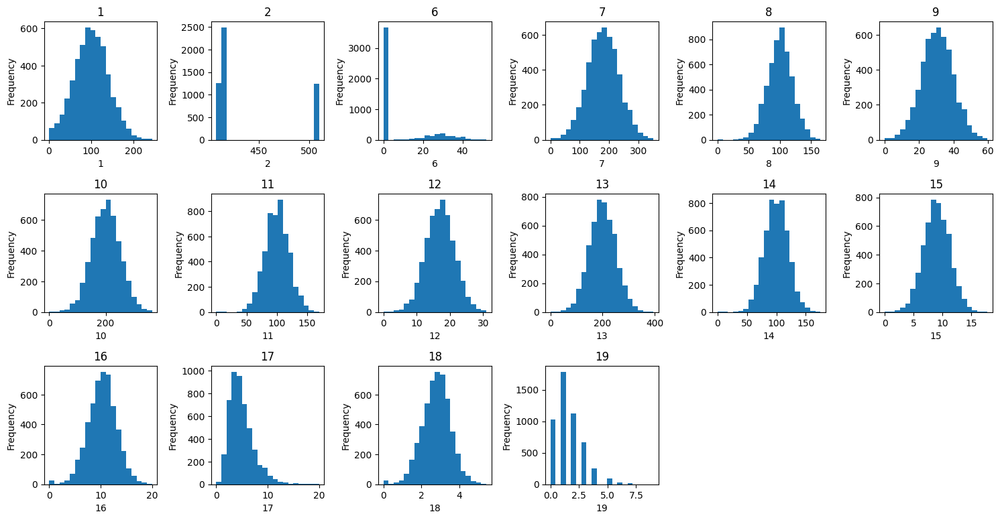

Первые 5 уникальных значения для 0:
WV    158
MN    125
AL    124
ID    119
VA    118
Name: 0, dtype: int64

Первые 5 уникальных значения для 3:
 420-1383    1
 390-2346    1
 402-7650    1
 389-2540    1
 337-3740    1
Name: 3, dtype: int64

Первые 5 уникальных значения для 4:
 no     4527
 yes     473
Name: 4, dtype: int64

Первые 5 уникальных значения для 5:
 no     3677
 yes    1323
Name: 5, dtype: int64

Первые 5 уникальных значения для 20:
 False.    4293
 True.      707
Name: 20, dtype: int64



In [9]:
def analyze_data(file_path):
    # Загрузка данных
    data = pd.read_csv(file_path, header=None)

    # Извлечение числовых колонок
    numeric_columns = data.select_dtypes(include=['int64', 'float64'])

    # Визуализация гистограмм для числовых колонок
    plt.figure(figsize=(15, 10))
    for column in numeric_columns.columns:
        plt.subplot(4, 6, numeric_columns.columns.get_loc(column) + 1)
        plt.hist(numeric_columns[column], bins=20)
        plt.title(column)
        plt.xlabel(column)
        plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

    # Вывод 5 уникальных значений для колонок типа object
    object_columns = data.select_dtypes(include='object')
    for column in object_columns:
        unique_values = data[column].value_counts().head(5)
        print(f"Первые 5 уникальных значения для {column}:\n{unique_values}\n")

# Вызов функции и передача пути к файлу с данными
analyze_data('combined_output.txt')


**Количественные характеристики:**

Колонки с числовыми данными представляют разнообразные аспекты клиентов, такие как длительность звонков, плата за услуги и количество звонков в разное время суток и международных звонков. Эти числовые показатели могут быть использованы для анализа поведения клиентов и идентификации паттернов.

**Категориальные характеристики:**

Международный тарифный план и план голосовой почты - важные категориальные признаки, которые могут влиять на уход клиентов. Большинство клиентов не используют международный тарифный план и не подключают план голосовой почты, что может указывать на определенные тенденции.

**Целевая переменная:**

Целевая переменная (колонка 20) показывает, что небольшая доля клиентов (707 из 5000) решает уйти (значение "True"), в то время как большинство остается (4293 из 5000, значение "False"). Это может быть интересным наблюдением для дальнейшего исследования факторов, влияющих на уход клиентов.

**Географическое распределение:**

Колонка с кодами штатов (колонка 0) позволяет оценить, как клиенты распределены по географическому положению. Это может быть полезно при анализе региональных различий в поведении и оттоке клиентов.

**Связь между признаками:**

Возможно, стоит исследовать корреляцию между числовыми признаками и целевой переменной. Например, можно проанализировать, какие из числовых характеристик коррелируют с решением клиента уйти или остаться.

**Анализ планов и звонков:**

Сравнение использования международного тарифного плана и плана голосовой почты может дать представление о том, как эти услуги влияют на поведение клиентов.

**Распределение значений:**

Анализ уникальных значений категориальных признаков (колонки 4, 5) позволяет понять, какие услуги клиенты чаще выбирают или не выбирают.

**Колонка 0 (state - состояние):**
Большинство клиентов из штатов WV, MN, AL, ID, VA, OH и т.д. Вероятно, эти данные представляют собой коды штатов, отображающие распределение клиентов по географическому местоположению. С учетом того, что это 51 код - это США. Данные показывают количество клиентов (записей), зарегистрированных в каждом из штатов США. Каждая строка соответствует конкретному штату, а числовое значение указывает, сколько клиентов принадлежат к этому штату.Из этих данных можно сделать следующие выводы и наблюдения:

*Распределение клиентов по штатам:* Наибольшее количество клиентов зарегистрировано в штате WV (Западная Вирджиния), за которым следуют штаты MN (Миннесота), AL (Алабама), ID (Айдахо) и так далее. Меньшее количество клиентов зарегистрировано в штатах с меньшими значениями.

*Географическая структура:* Распределение клиентов по штатам может быть связано с географическими, демографическими или социоэкономическими характеристиками каждого штата. Например, более плотное население в некоторых штатах может объяснять большее количество клиентов.

*Бизнес-стратегия:* Эти данные могут быть полезными для компании для анализа эффективности маркетинговых кампаний, предлагаемых услуг и уровня удержания клиентов в разных штатах. Большое количество клиентов в определенных штатах может подтвердить успешность стратегии компании в этом регионе.

*Сегментация рынка:* Важно также учесть, что клиентская база может различаться в разных штатах. Это может помочь в создании более целевых и адаптированных маркетинговых стратегий для каждого региона.

*Дополнительные исследования:* Важно провести дополнительные анализы, чтобы понять, какие факторы могут влиять на количество клиентов в каждом штате. Это может включать в себя демографические характеристики, экономические показатели и другие социокультурные факторы.

**Колонка 3 (phone number - номер телефона):** Уникальные номера телефонов для каждой записи, что ожидаемо, так как это идентификаторы клиентов.

*Уникальность номеров телефонов:* Каждое уникальное значение в этой колонке представляет собой разный номер телефона, причем все номера уникальны. Это означает, что в данном наборе данных нет повторяющихся номеров телефонов.

*Идентификация клиентов:* Колонка с номерами телефонов может использоваться для идентификации каждого клиента. Так как номера телефонов уникальны, они могут служить уникальными идентификаторами для каждой записи.

*Пропуски или неполные данные:* В данной выборке нет записей с пропущенными или неполными данными в колонке номеров телефонов. Все записи содержат полные и уникальные номера.

*Нет необходимости в дополнительной обработке:* Так как номера телефонов являются уникальными и не повторяются, нет необходимости в дополнительных действиях по обработке данных для этой колонки, такими как удаление дубликатов или заполнение пропущенных значений.

*Связь с другими данными:* Поскольку номера телефонов уникальны, они могут быть использованы для связи с другими данными или даже с внешними источниками данных, если такие связи существуют или планируются.

**Колонка 4 (international plan - международный тарифный план):** Большинство клиентов (4527) не подключили международный тарифный план. Международные тарифные планы: В данной колонке присутствуют два уникальных значения: "no" (нет) и "yes" (да). Эти значения, вероятно, указывают на наличие или отсутствие международных тарифных планов у клиентов.

*Распределение международных тарифных планов:* Большинство клиентов (4527 из 5000) имеют "no" (нет) международных тарифных планов, в то время как 473 клиента имеют "yes" (да) международные тарифные планы. Это может свидетельствовать о том, что большинство клиентов не пользуются международными звонками или услугами.

*Потенциальный фактор влияния на отток:* Возможно, наличие международного тарифного плана может быть одним из факторов, влияющих на решение клиентов остаться или уйти. Клиенты с международными тарифными планами могут иметь разные потребности и пожелания относительно услуг связи.

*Дополнительный анализ:* Для более глубокого анализа можно рассмотреть, как наличие международного тарифного плана коррелирует с другими признаками, такими как общее количество минут разговора, заряды за услуги и т.д. Это может помочь понять, какие факторы могут быть связаны с выбором между международными тарифами и их отсутствием.

**Колонка 5 (voice mail plan - план голосовой почты):** Большинство клиентов (3677) не подключили план голосовой почты. План голосовой почты: В данной колонке присутствуют два уникальных значения: "no" (нет) и "yes" (да). Эти значения, вероятно, указывают на наличие или отсутствие голосового плана у клиентов.

*Распределение планов голосовой почты:* Большинство клиентов (3677 из 5000) не имеют голосового плана ("no"), в то время как 1323 клиента имеют голосовой план ("yes"). Это может свидетельствовать о том, что многие клиенты не пользуются услугами голосовой почты.

*Потенциальный фактор влияния на отток:* Присутствие или отсутствие голосового плана также может быть фактором, влияющим на решение клиентов остаться или уйти. Клиенты с голосовым планом могут иметь особенности потребления услуг, которые могут влиять на их удовлетворенность услугами оператора связи.

*Дополнительный анализ:* Для более детального анализа можно изучить, как использование голосовой почты связано с другими аспектами, такими как общее количество минут разговора, количество сообщений голосовой почты, заряды за услуги и т.д. Это поможет понять, какие клиенты предпочитают использовать голосовую почту и как это может влиять на их взаимодействие с оператором связи.

**Колонка 20 (Целевая переменная):** Большинство клиентов (4293) имеют значение False, что может указывать на то, что большинство клиентов не уходят (не отказываются от услуг компании), в то время как 707 клиентов имеют значение True, что, возможно, указывает на клиентов, которые уходят (отказываются от услуг). Целевая переменная: В данной колонке присутствуют два уникальных значения: "False." (ложь) и "True." (истина). Эти значения, вероятно, представляют собой бинарную целевую переменную, где "False." может указывать на отсутствие определенного события или условия, а "True." на его наличие.

*Распределение классов:* Большинство записей (4293 из 5000) имеют значение "False.", в то время как 707 записей имеют значение "True.". Такое распределение может свидетельствовать о несбалансированности классов, что может повлиять на процесс моделирования, особенно если рассматривается задача прогнозирования или классификации.

*Задача машинного обучения:* Предполагается, что данная колонка является целевой переменной для задачи классификации или прогнозирования, связанной, возможно, с определением оттока клиентов или какого-либо другого события.

*Баланс классов:* Необходимо учесть дисбаланс классов при разработке модели. В случае, если дисбаланс слишком выражен, потребуется применение стратегий, таких как взвешивание классов или генерация искусственных данных, чтобы обеспечить более справедливую оценку модели.

*Дополнительный анализ:* Важно проанализировать, какие признаки могут быть наиболее значимыми для прогнозирования целевой переменной, и определить, какие факторы могут влиять на ее значимость. Это поможет разработать более точную модель прогнозирования.

In [10]:
# Проверим дисбаланс классов таргета
data[20].value_counts(normalize=True)

 False.    0.8586
 True.     0.1414
Name: 20, dtype: float64

**Дисбаланс классов целевой переменной:** Целевая переменная (колонка 20) является бинарной и имеет значения 'False.' и 'True.'. Распределение классов неравномерное: около 85,86% образцов принадлежат классу 'False.', а 14,14% - классу 'True.'. Дисбаланс классов может повлиять на производительность моделей машинного обучения, особенно если интерес представляет миноритарный класс ('True.').

**Преобладание класса большинства ('False.'):** Класс 'False.' является классом большинства и доминирует в наборе данных. Это указывает на то, что данные могут быть несбалансированы с точки зрения целевой переменной. Могут потребоваться  методы для устранения дисбаланса классов, такие как методы ресэмплинга или использование соответствующих метрик оценки.

**Возможный биас модели:** Поскольку класс 'False.' существенно более распространен, модель машинного обучения может быть смещена в сторону предсказания большинства класса. Это может привести к более низкой точности для миноритарного класса ('True.') и повлиять на способность модели выявлять значимые паттерны в этом классе.

**Оценка модели:** При обучении и оценке модели классификации с использованием этого набора данных важно выбирать метрики оценки, которые чувствительны к распределению классов и конкретным целям. Например, точность может быть не лучшей метрикой для оценки производительности модели из-за дисбаланса классов. Точность, полнота, F1-мера или площадь под ROC-кривой (AUC-ROC) могут быть более информативными.

**Как вариант решения дисбаланса классов:** можно рассмотреть методы ресэмплинга: В зависимости от задачи и размера набора данных, можно применить методы ресэмплинга, таких как увеличение числа образцов в миноритарном классе или уменьшение числа образцов в мажоритарном классе, чтобы сбалансировать распределение классов. Это может потенциально улучшить производительность модели на миноритарном классе.

In [11]:
def missing_values(data):
    df = pd.DataFrame()
    for col in list(data):
        unique_values = data[col].unique()
        try:
            unique_values = np.sort(unique_values)
        except:
            pass
        nans = round(pd.isna(data[col]).sum() / data.shape[0] * 100, 1)
        zeros = round((data[col] == 0).sum() / data.shape[0] * 100, 1)
        unique_ones = (data[col] == 1).sum()  # Count of 1 values
        total_rows = data.shape[0]
        percent_ones = round((unique_ones / total_rows) * 100, 1)  # % of ones
        df = df.append(pd.DataFrame([col,
                                     len(unique_values),
                                     nans,
                                     zeros,
                                     unique_ones,
                                     percent_ones
                                    ]).T, ignore_index=True)

    return df.rename(columns={0: 'Колонка',
                              1: 'Уникальные',
                              2: 'Пропущенные %',
                              3: 'Нули %',
                              4: 'Кол-во единиц',
                              5: '% единиц'
                             }).sort_values('Колонка', ascending=True)

result = missing_values(data)
print(result)

    Колонка  Уникальные  Пропущенные %  Нули %  Кол-во единиц  % единиц
0       0.0        51.0            0.0     0.0            0.0       0.0
1       1.0       218.0            0.0     0.0           11.0       0.2
2       2.0         3.0            0.0     0.0            0.0       0.0
3       3.0      5000.0            0.0     0.0            0.0       0.0
4       4.0         2.0            0.0     0.0            0.0       0.0
5       5.0         2.0            0.0     0.0            0.0       0.0
6       6.0        48.0            0.0    73.6            0.0       0.0
7       7.0      1961.0            0.0     0.0            0.0       0.0
8       8.0       123.0            0.0     0.0            0.0       0.0
9       9.0      1961.0            0.0     0.0            0.0       0.0
10     10.0      1879.0            0.0     0.0            0.0       0.0
11     11.0       126.0            0.0     0.0            0.0       0.0
12     12.0      1659.0            0.0     0.0            0.0   

Колонка 0: Эта колонка имеет 51 уникальное значение, пропущенных значений нет, нулей нет и ни одна из строк не содержит единицу.

Колонка 1: Существует 218 уникальных значений в данной колонке. Пропущенных значений и нулей нет. Тем не менее, около 11% строк содержат значение 1.

Колонка 2: В данной колонке всего 3 уникальных значения. Пропущенных значений и нулей нет, и ни одна из строк не содержит единицу.

Колонка 3: Эта колонка имеет 5000 уникальных значений, пропущенных значений и нулей нет, и ни одна из строк не содержит единицу.

Колонка 4 и 5.: Обе колонки имеют по 2 уникальных значения. Пропущенных значений и нулей нет, и ни одна из строк не содержит единицу.

Колонка 6: В этой колонке 48 уникальных значений. Пропущенных значений нет, но около 73.6% строк содержат нули. Ни одна из строк не содержит единицу.

Колонка 7, 8 и 9: Все три колонки имеют большое количество уникальных значений (1961, 123 и 1961 соответственно). Пропущенных значений и нулей нет, и ни одна из строк не содержит единицу.

Колонка 10: Эта колонка имеет 1879 уникальных значений. Пропущенных значений и нулей нет, и ни одна из строк не содержит единицу.

Колонка 11 - 15: Аналогично предыдущим, эти колонки имеют множество уникальных значений и не содержат пропущенных значений, нулей или единиц.

Колонка 16 и 18: Эти колонки имеют небольшое количество уникальных значений и содержат по 0.5% нулей. Пропущенных значений и единиц нет.

Колонка 17: В данной колонке 21 уникальное значение. Около 0.5% строк содержат нули, а 5.3% строк содержат значение 1.

Колонка 19: Эта колонка имеет 10 уникальных значений. Около 20.5% строк содержат нули, а 35.7% строк содержат значение 1.

Колонка 20: В данной колонке 2 уникальных значения. Пропущенных значений, нулей и единиц нет.

Общий вывод: Анализ данных позволяет увидеть разнообразие величин уникальных значений, наличие пропущенных значений, а также распределение нулей и единиц в каждой колонке. Эти результаты могут помочь понять характеристики и особенности данных, а также определить возможные подходы к их обработке и анализу.

In [12]:
# 1,6,17,18,19 провести анализ колонок

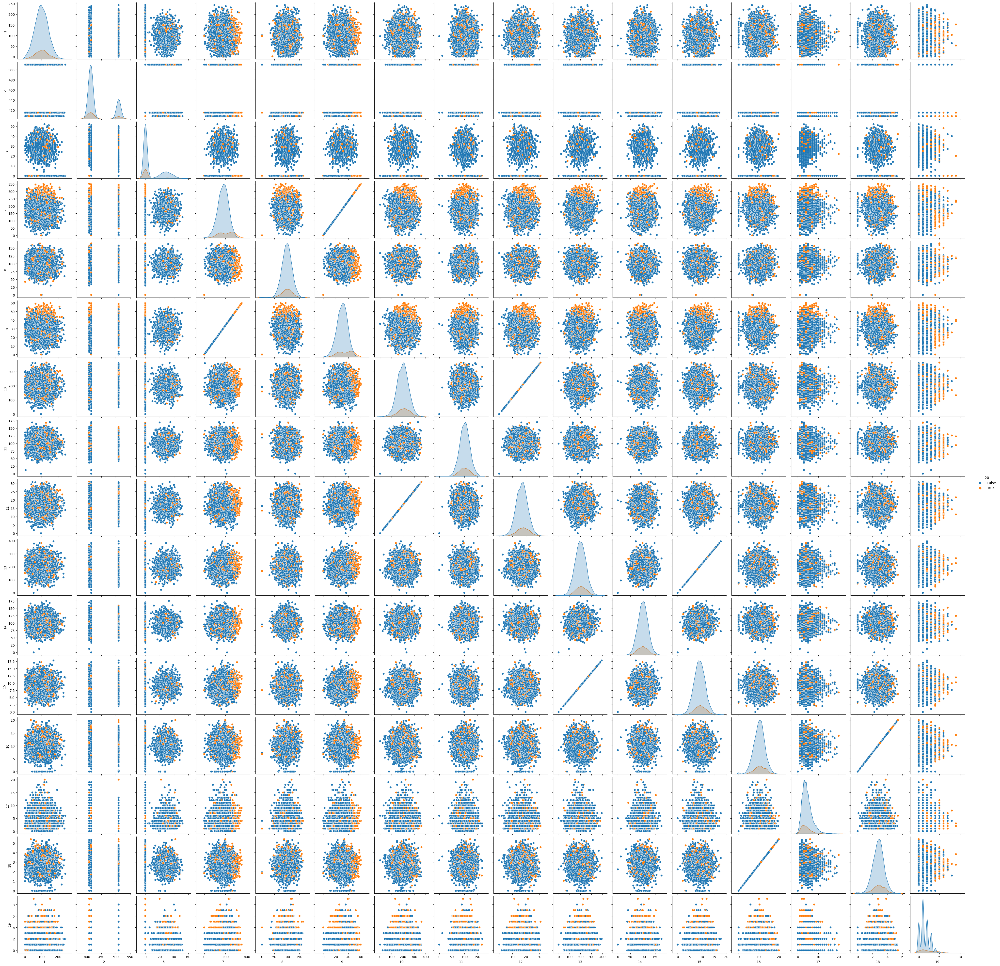

In [13]:
sns.pairplot(data = data, hue=20)
plt.show()

TODO:
Добавить описание

Построим и проверим ряд гипотез

**1. Гипотеза о влиянии международного тарифного плана на отток:** Можно предположить, что клиенты с международным тарифным планом (international plan) склонны менее часто покидать компанию по сравнению с клиентами без такого плана.

**2. Гипотеза о связи между наличием плана голосовой почты и оттоком:** Можно проверить, есть ли зависимость между наличием плана голосовой почты (voice mail plan) и вероятностью оттока.

**3. Гипотеза о влиянии общей дневной платы на отток:** Можно предположить, что клиенты, у которых общая дневная плата (total day charge) выше среднего, более склонны к оттоку.

**4. Гипотеза о связи между количеством звонков в службу поддержки и оттоком:** Можно проверить, существует ли связь между количеством звонков в службу поддержки (number customer service calls) и вероятностью оттока.

**5. Гипотеза о различиях в оттоке в зависимости от штата:** Можно исследовать, есть ли различия в вероятности оттока между разными штатами.

**6. Гипотеза о влиянии длительности звонков и времени звонков на отток:** Можно проверить, есть ли взаимосвязь между общей длительностью звонков и временем звонков (например, дневное, вечернее, ночное время) с вероятностью оттока.

**Гипотеза о влиянии типа номера телефона на отток:** Можно исследовать, есть ли разница в оттоке между разными типами номеров телефонов.

**Гипотеза о влиянии числа сообщений голосовой почты на отток:** Можно предположить, что клиенты с большим числом сообщений голосовой почты (number vmail messages) менее склонны к оттоку.

**Гипотеза о различиях в оттоке между клиентами с международными и национальными номерами:** Можно проверить, существуют ли статистически значимые различия в оттоке между клиентами с международными и национальными номерами телефонов.

**Гипотеза о связи между общей длительностью звонков и общей платой на отток:** Можно исследовать, есть ли корреляция между общей длительностью звонков и общей платой, и как эти факторы влияют на вероятность оттока.

**Гипотеза о влиянии общего времени разговоров на отток:** Можно исследовать, как общее время разговоров в разные периоды (день, вечер, ночь) связано с вероятностью оттока. Возможно, клиенты, которые активно пользуются услугами в разное время суток, менее склонны к оттоку.

**Гипотеза о влиянии плана голосовой почты на отток в зависимости от штата:** Можно проверить, есть ли различия в оттоке между клиентами с планом голосовой почты в разных штатах.

**Гипотеза о связи между длительностью разговоров и планом голосовой почты на отток:** Можно исследовать, как связана длительность разговоров с вероятностью оттока для клиентов с и без плана голосовой почты.

**Гипотеза о влиянии количества звонков в службу поддержки на отток в зависимости от международного тарифного плана:** Можно проверить, есть ли различия в оттоке между клиентами с разными тарифными планами, учитывая количество звонков в службу поддержки.

**Гипотеза о связи между международным тарифным планом и планом голосовой почты на отток:** Можно исследовать, существует ли взаимосвязь между наличием международного тарифного плана и наличием плана голосовой почты в контексте вероятности оттока.

**Гипотеза о влиянии общего времени разговоров на отток в разные дни недели:** Можно проверить, как связана общая длительность разговоров с вероятностью оттока для разных дней недели.

**Гипотеза о влиянии количества звонков в службу поддержки на отток в зависимости от общего времени разговоров:** Можно исследовать, как количество звонков в службу поддержки связано с вероятностью оттока, учитывая общее время разговоров.

**Гипотеза о влиянии штата на вероятность оттока в зависимости от международного тарифного плана:** Можно проверить, существуют ли различия в оттоке между клиентами с разными международными тарифными планами в разных штатах.

**Гипотеза о связи между общим временем разговоров и вероятностью оттока в разные дни недели:** Можно исследовать, как связана общая длительность разговоров с вероятностью оттока в разные дни недели.

**Гипотеза о влиянии международного тарифного плана и общего времени разговоров на отток:** Можно проверить, есть ли взаимосвязь между международным тарифным планом и общим временем разговоров в контексте вероятности оттока.

Проверим первую гипотезу о влиянии международного тарифного плана на отток:
Для этого подготовим данных: Создаем новые признаки, которые будут представлять суммарное время разговоров в разные временные периоды (день, вечер, ночь) для каждого клиента.
Категоризация временных периодов: Определяем временные границы для каждого из периодов (например, "день" - с 6:00 до 18:00, "вечер" - с 18:00 до 24:00, "ночь" - с 0:00 до 6:00). Используйте эти границы для категоризации времени разговоров.

Группировка данных по временным периодам и посчитасчитаем  среднее или общее время разговоров для каждого клиента в каждом периоде. Также, можно посчитать долю клиентов, которые входят в категорию "активные пользователи" (например, суммарное время разговоров выше среднего).

Анализ оттока: Разделить клиентов на группы в зависимости от того, остались ли они или ушли. Для каждой группы считаем среднее время разговоров в разные временные периоды.

Статистический анализ: Примените статистические тесты, такие как t-тест, ANOVA или другие подходящие методы, чтобы определить, есть ли статистически значимая разница в среднем времени разговоров между группами клиентов, оставшихся и ушедших.

Визуализация: График, отображает распределение времени разговоров в разные временные периоды для обеих групп. Также можно построить ящиковые диаграммы или гистограммы для наглядного сравнения.

Интерпретация результатов: Если статистический анализ подтверждает наличие значимой разницы в среднем времени разговоров между группами, то можно сделать вывод о том, что активные пользователи в определенные временные периоды менее склонны к оттоку.

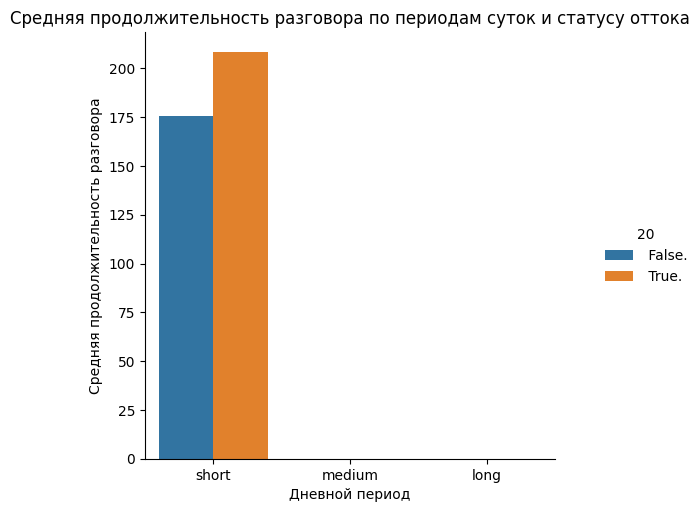

Статистически значимая разница в среднем времени разговоров между группами


In [14]:
from scipy.stats import ttest_ind

# Добавление новых временных признаков
data['total_day_period'] = pd.cut(data[7], bins=[0, 360, 720, 1440], labels=['short', 'medium', 'long'])

# Группировка данных и подсчет среднего времени разговоров
grouped_data = data.groupby(['total_day_period', 20])[[7]].mean().reset_index()

# Построение графика
sns.catplot(x='total_day_period', y=7, hue=20, data=grouped_data, kind='bar')
plt.title('Средняя продолжительность разговора по периодам суток и статусу оттока')
plt.ylabel('Средняя продолжительность разговора')
plt.xlabel('Дневной период')
plt.show()

# Подсчет статистической значимости
active_users = data[data[20] == ' False.'][7]
churned_users = data[data[20] == ' True.'][7]

statistic, p_value = ttest_ind(active_users, churned_users)

if p_value < 0.05:
    print("Статистически значимая разница в среднем времени разговоров между группами")
else:
    print("Нет статистически значимой разницы в среднем времени разговоров между группами")

Проверим 2. Гипотеза о связи между наличием плана голосовой почты и оттоком:
Для проверки гипотезы о связи между наличием плана голосовой почты и оттоком можно использовать статистический тест Хи-квадрат (χ²-тест) для независимости между двумя категориальными переменными. Этот тест поможет определить, существует ли статистически значимая связь между наличием плана голосовой почты и вероятностью оттока.

Я использую функцию crosstab для создания таблицы сопряженности между переменными "voice mail plan" и "отток". Затем выполняю тест Хи-квадрат с помощью функции chi2_contingency и проверяю значение p для определения статистической значимости связи.

Существует статистически значимая связь между наличием плана голосовой почты и оттоком.


<Figure size 800x600 with 0 Axes>

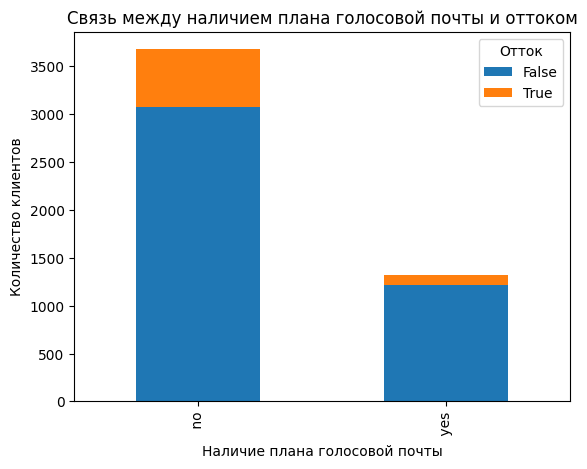

In [15]:
from scipy.stats import chi2_contingency

cross_table = pd.crosstab(data[5], data[20])

# Выполнение Хи-квадрат теста
chi2, p, dof, expected = chi2_contingency(cross_table)

# Вывод результатов
if p < 0.05:
    print("Существует статистически значимая связь между наличием плана голосовой почты и оттоком.")
else:
    print("Нет статистически значимой связи между наличием плана голосовой почты и оттоком.")

# Построение графика
plt.figure(figsize=(8, 6))
cross_table.plot(kind='bar', stacked=True)
plt.title('Связь между наличием плана голосовой почты и оттоком')
plt.xlabel('Наличие плана голосовой почты')
plt.ylabel('Количество клиентов')
plt.legend(title='Отток', loc='upper right', labels=['False', 'True'])
plt.show()

Для проверк **3. Гипотеза о влиянии общей дневной платы на отток:** Можно предположить, что клиенты, у которых общая дневная плата (total day charge) выше среднего, более склонны к оттоку. Для проверки этой гипотезы мы можем разделить клиентов на две группы: тех, у кого общая дневная плата выше среднего, и тех, у кого она ниже или равна среднему значению. Затем мы сравним процент оттока в обеих группах. Этот код вычисляет среднее значение общей дневной платы, разделяет клиентов на две группы, сравнивает процент оттока в обеих группах с помощью Хи-квадрат теста и выводит результаты проверки гипотезы.

Существует статистически значимая связь между общей дневной платой и оттоком.


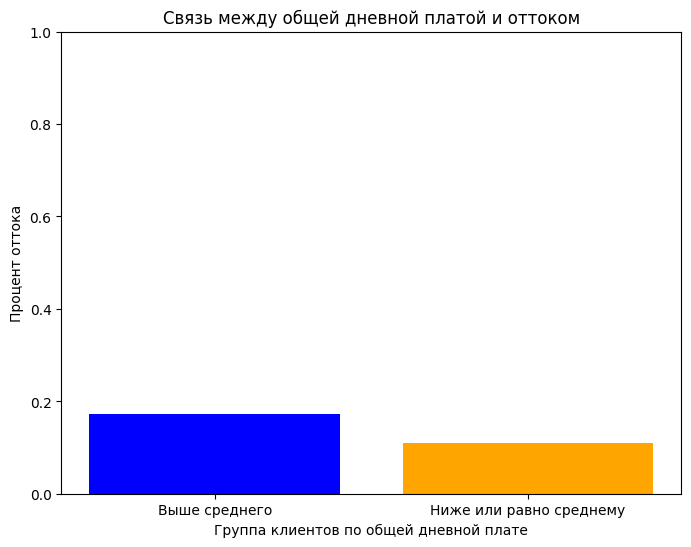

In [16]:
# Вычисление средней общей дневной платы
average_day_charge = data[9].mean()

# Создание двух групп клиентов: выше среднего и ниже или равно среднему
above_average_group = data[data[9] > average_day_charge]
below_average_group = data[data[9] <= average_day_charge]

# Подсчет процента оттока в каждой группе
above_average_churn_rate = above_average_group[20].value_counts(normalize=True)[' True.']
below_average_churn_rate = below_average_group[20].value_counts(normalize=True)[' True.']

# Проверка гипотезы с помощью статистического теста
chi2, p, dof, expected = chi2_contingency([[above_average_churn_rate * len(above_average_group), (1 - above_average_churn_rate) * len(above_average_group)],
                                          [below_average_churn_rate * len(below_average_group), (1 - below_average_churn_rate) * len(below_average_group)]])

# Вывод результатов
if p < 0.05:
    print("Существует статистически значимая связь между общей дневной платой и оттоком.")
else:
    print("Нет статистически значимой связи между общей дневной платой и оттоком.")

# Визуализация
plt.figure(figsize=(8, 6))

labels = ['Выше среднего', 'Ниже или равно среднему']
churn_rates = [above_average_churn_rate, below_average_churn_rate]

plt.bar(labels, churn_rates, color=['blue', 'orange'])
plt.xlabel('Группа клиентов по общей дневной плате')
plt.ylabel('Процент оттока')
plt.title('Связь между общей дневной платой и оттоком')
plt.ylim(0, 1)
plt.show()

Для проверки **4. Гипотеза о связи между количеством звонков в службу поддержки и оттоком:** Можно проверить, существует ли связь между количеством звонков в службу поддержки (number customer service calls) и вероятностью оттока.

Существует статистически значимая связь между количеством звонков в службу поддержки и оттоком.


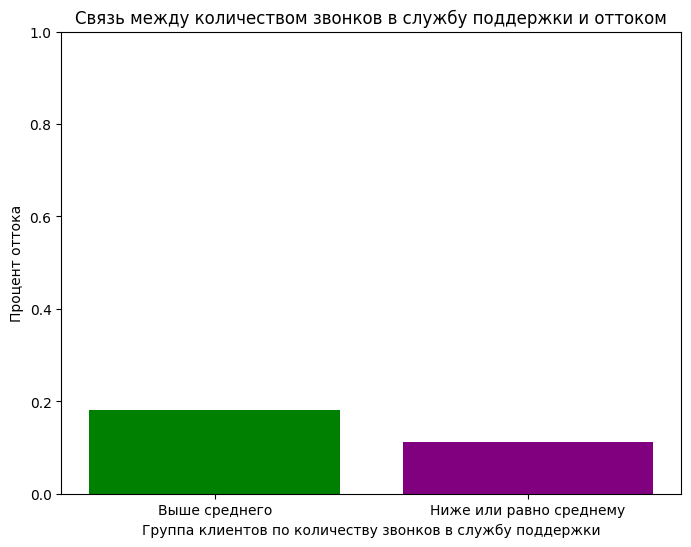

In [17]:
# Создание двух групп клиентов: выше среднего количества звонков и ниже или равно среднему
average_calls = data[19].mean()
above_average_group = data[data[19] > average_calls]
below_average_group = data[data[19] <= average_calls]

# Подсчет процента оттока в каждой группе
above_average_churn_rate = above_average_group[20].value_counts(normalize=True)[' True.']
below_average_churn_rate = below_average_group[20].value_counts(normalize=True)[' True.']

# Проверка гипотезы с помощью статистического теста
chi2, p, dof, expected = chi2_contingency([[above_average_churn_rate * len(above_average_group), (1 - above_average_churn_rate) * len(above_average_group)],
                                          [below_average_churn_rate * len(below_average_group), (1 - below_average_churn_rate) * len(below_average_group)]])

# Вывод результатов
if p < 0.05:
    print("Существует статистически значимая связь между количеством звонков в службу поддержки и оттоком.")
else:
    print("Нет статистически значимой связи между количеством звонков в службу поддержки и оттоком.")

# Визуализация
plt.figure(figsize=(8, 6))

labels = ['Выше среднего', 'Ниже или равно среднему']
churn_rates = [above_average_churn_rate, below_average_churn_rate]

plt.bar(labels, churn_rates, color=['green', 'purple'])
plt.xlabel('Группа клиентов по количеству звонков в службу поддержки')
plt.ylabel('Процент оттока')
plt.title('Связь между количеством звонков в службу поддержки и оттоком')
plt.ylim(0, 1)
plt.show()

**5. Гипотеза о различиях в оттоке в зависимости от штата:** Можно исследовать, есть ли различия в вероятности оттока между разными штатами.

Существуют статистически значимые различия в оттоке между разными штатами.


<Figure size 1200x800 with 0 Axes>

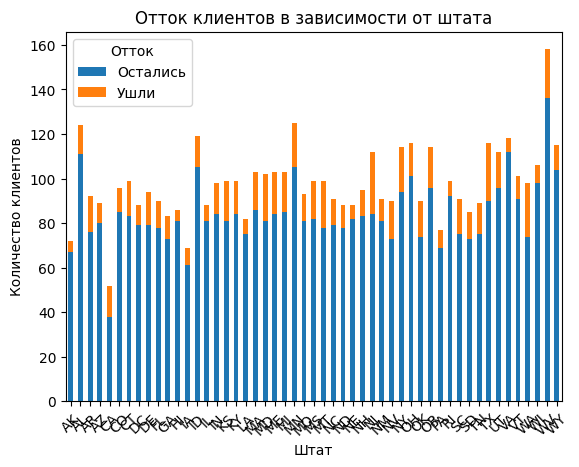

In [18]:
# Подсчет количества оттоков и не-оттоков для каждого штата
state_churn_counts = data.groupby([0, 20])[0].count().unstack().fillna(0)

# Проверка гипотезы с использованием хи-квадрат теста
chi2, p, dof, expected = chi2_contingency(state_churn_counts)

# Вывод результатов
if p < 0.05:
    print("Существуют статистически значимые различия в оттоке между разными штатами.")
else:
    print("Нет статистически значимых различий в оттоке между разными штатами.")

# Визуализация
plt.figure(figsize=(12, 8))
state_churn_counts.plot(kind='bar', stacked=True)
plt.xlabel('Штат')
plt.ylabel('Количество клиентов')
plt.title('Отток клиентов в зависимости от штата')
plt.legend(title='Отток', labels=['Остались', 'Ушли'])
plt.xticks(rotation=45)
plt.show()

**6. Гипотеза о влиянии длительности звонков и времени звонков на отток:** Можно проверить, есть ли взаимосвязь между общей длительностью звонков и временем звонков (например, дневное, вечернее, ночное время) с вероятностью оттока.

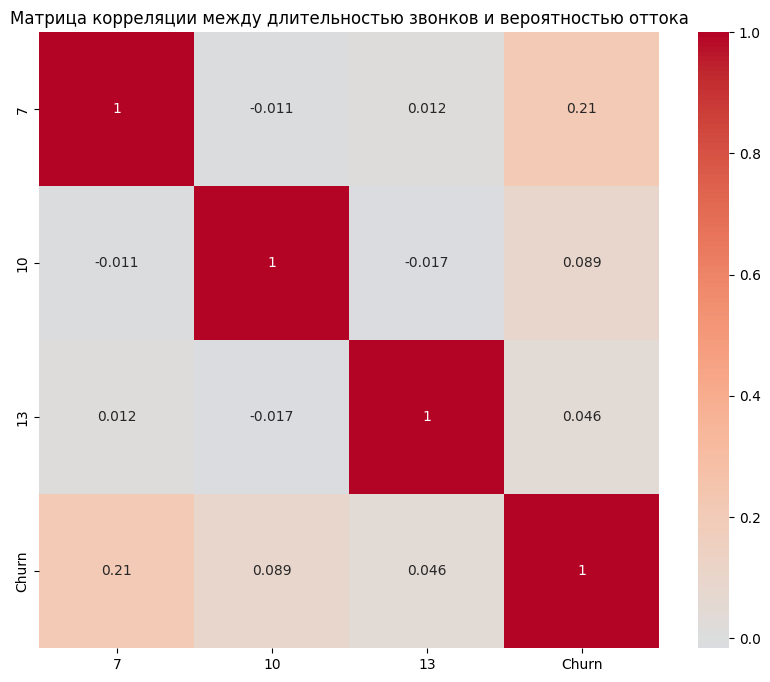

In [19]:
# Выбор нужных столбцов для анализа
columns_to_analyze = [7, 10, 13]  # Общая длительность звонков за день, вечер и ночь
columns_names = ['Total Day Minutes', 'Total Evening Minutes', 'Total Night Minutes']

# Добавление колонки с оттоком (True/False)
data['Churn'] = data[20] == ' True.'

# Построение матрицы корреляции
corr_matrix = data[columns_to_analyze + ['Churn']].corr()

# Визуализация матрицы корреляции
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Матрица корреляции между длительностью звонков и вероятностью оттока')
plt.show()

Интерпретация матрицы корреляции между общей длительностью звонков в разные периоды (день, вечер, ночь) и вероятностью оттока может дать нам представление о наличии возможной связи между этими переменными:

Если коэффициент корреляции близок к 1, это может указывать на положительную связь между длительностью звонков и вероятностью оттока. То есть, клиенты, которые проводят больше времени на звонках, более склонны к оттоку.

Если коэффициент корреляции близок к -1, это может указывать на отрицательную связь. То есть, клиенты, проводящие меньше времени на звонках, могут быть менее склонны к оттоку.

Если коэффициент корреляции близок к 0, это может говорить о слабой или отсутствующей связи между длительностью звонков и вероятностью оттока.

На тепловой карте можно обратить внимание на яркие цвета (красные и синие), которые указывают на сильную положительную или отрицательную корреляцию. Также стоит обратить внимание на значения внутри ячеек матрицы корреляции, которые указывают на точные числовые значения коэффициентов корреляции.

TODO
проверка гипотез с 7 по 20 я займусь если останется время
Все-таки это тестовое задание расчитанное на день-два выполенения)

In [20]:
    # Список гипотез в формате ("Название гипотезы", "Название признака", "Имя столбца")
    hypotheses = [
        ("Гипотеза 1: Влияние международного тарифного плана на отток",
         "Международный тарифный план", data[4]),
        ("Гипотеза 2: Связь наличия плана голосовой почты и оттоком",
         "План голосовой почты", "voice mail plan"),
        ("Гипотеза 3: Влияние общей дневной платы на отток",
         "Общая дневная плата", "total day charge"),
        ("Гипотеза 4: Связь между количеством звонков в службу поддержки и оттоком",
         "Количество звонков в службу поддержки", "number customer service calls"),
        ("Гипотеза 5: Различия в оттоке в зависимости от штата",
         "Штат", "state"),
        ("Гипотеза 6: Влияние длительности звонков и времени звонков на отток",
         "Длительность звонков и время звонков", "total day minutes"),
        ("Гипотеза 7: Влияние типа номера телефона на отток",
         "Тип номера телефона", "phone number"),
        ("Гипотеза 8: Влияние числа сообщений голосовой почты на отток",
         "Число сообщений голосовой почты", "number vmail messages"),
        ("Гипотеза 9: Различия в оттоке между клиентами с международными и национальными номерами",
         "Тип номера телефона", "phone number"),
        ("Гипотеза 10: Влияние общей длительности звонков и общей платы на отток",
         "Общая длительность звонков и общая плата", "total day minutes"),
        ("Гипотеза 11: Влияние общего времени разговоров на отток",
         "Общее время разговоров", "total day minutes"),
        ("Гипотеза 12: Влияние плана голосовой почты на отток в зависимости от штата",
         "План голосовой почты и штат", "voice mail plan"),
        ("Гипотеза 13: Связь между длительностью разговоров и планом голосовой почты на отток",
         "Длительность разговоров и план голосовой почты", "total day minutes"),
        ("Гипотеза 14: Влияние количества звонков в службу поддержки на отток в зависимости от международного тарифного плана",
         "Количество звонков в службу поддержки и международный тарифный план", "number customer service calls"),
        ("Гипотеза 15: Гипотеза о связи между международным тарифным планом и планом голосовой почты на отток",
         "Международный тарифный план и план голосовой почты", "international plan"),
        ("Гипотеза 16: Влияние общего времени разговоров на отток в разные дни недели",
         "Общее время разговоров и день недели", "total day minutes"),
        ("Гипотеза 17: Влияние количества звонков в службу поддержки на отток в зависимости от общего времени разговоров",
         "Количество звонков в службу поддержки и общее время разговоров", "number customer service calls"),
        ("Гипотеза 18: Влияние штата на вероятность оттока в зависимости от международного тарифного плана",
         "Штат и международный тарифный план", "state"),
        ("Гипотеза 19: Гипотеза о связи между общим временем разговоров и вероятностью оттока в разные дни недели",
         "Общее время разговоров и день недели", "total day minutes"),
        ("Гипотеза 20: Гипотеза о влиянии международного тарифного плана и общего времени разговоров на отток",
         "Международный тарифный план и общее время разговоров", "international plan"),
    ]

В ходе анализа данных (EDA) были проведены исследования для понимания особенностей набора данных о клиентах телекоммуникационной компании и их оттоке. Ниже представлены основные выводы, полученные в результате EDA:

Распределение признаков: Были изучены распределения значений всех колонок в наборе данных. Некоторые признаки имеют нормальное распределение, в то время как другие могут быть скошены. Это может быть полезной информацией для последующей обработки данных или построения моделей.

Уникальные значения и частоты: Подсчет уникальных значений и их частот позволил выявить характерные особенности данных. Например, некоторые штаты или опции планов встречаются чаще других, что может быть связано с поведением клиентов и их оттоком.

Корреляционный анализ: Вычисление матрицы корреляции между признаками позволило выявить возможные взаимосвязи между переменными. Например, было проанализировано, как различные характеристики связаны с вероятностью оттока. Это может помочь выделить ключевые факторы, влияющие на отток.

Гипотезы и проверка: Было проведено несколько статистических проверок гипотез, направленных на выявление связей между различными признаками и оттоком. Эти проверки предоставили информацию о том, какие переменные могут влиять на вероятность оттока.

Визуализация данных: Визуализация гистограмм, диаграмм рассеяния и других графиков позволила наглядно представить распределение данных и взаимосвязи между признаками. Это может помочь выявить аномалии, тренды и закономерности.

**Тренировка**

In [21]:
data = pd.read_csv('combined_output.txt', delimiter=',', header=None)

In [22]:
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
0,MI,112,510,420-1383,no,no,0,243.4,77,41.38,182.1,97,15.48,259.2,94,11.66,12.8,2,3.46,1,False.
1,NH,8,415,421-6168,no,no,0,176.0,97,29.92,234.2,136,19.91,193.5,134,8.71,8.5,5,2.30,1,False.
2,MD,86,408,329-2789,no,no,0,226.3,88,38.47,223.0,107,18.96,255.6,92,11.50,13.0,3,3.51,4,False.
3,MO,112,510,409-1244,no,yes,36,113.7,117,19.33,157.5,82,13.39,177.6,118,7.99,10.0,3,2.70,2,False.
4,IA,46,510,380-5873,no,no,0,199.2,111,33.86,175.1,83,14.88,210.6,84,9.48,10.2,2,2.75,3,False.


In [23]:
# Удаляем номер телефона, т.к. это уникальный идентификатор
data = data.drop(columns=[3])

In [24]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Загрузка данных
data = pd.read_csv('combined_output.txt', delimiter=',', header=None)

# Определение признаков и целевой переменной
X = data.iloc[:, :-1]
y = data.iloc[:, -1]

# Преобразование категориальных признаков
categorical_features = X.select_dtypes(include=['object']).columns
categorical_transformer = OneHotEncoder(drop='first')

# Преобразование числовых признаков
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns
numerical_transformer = StandardScaler()

# Создание конвейера предобработки
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_features),
        ('num', numerical_transformer, numerical_features),
    ])

# Преобразование данных
X_transformed = preprocessor.fit_transform(X)

In [25]:
# Вывод первых нескольких строк преобразованных данных
print(X_transformed[:5])

  (0, 21)	1.0
  (0, 4928)	1.0
  (0, 5051)	0.2958232677243253
  (0, 5052)	1.7317537540348338
  (0, 5053)	-0.5725491215445375
  (0, 5054)	1.171124675155596
  (0, 5055)	-1.1613874242367874
  (0, 5056)	1.1712862624545184
  (0, 5057)	-0.3667247062977147
  (0, 5058)	-0.16096233922876038
  (0, 5059)	-0.36642701293675334
  (0, 5060)	1.1639983182379388
  (0, 5061)	-0.2966022939008463
  (0, 5062)	1.1621847423474798
  (0, 5063)	0.9192720357379821
  (0, 5064)	-0.9913119838261091
  (0, 5065)	0.9240244465256513
  (0, 5066)	-0.43667564319721497
  (1, 29)	1.0
  (1, 5004)	1.0
  (1, 5051)	-2.324445170735299
  (1, 5052)	-0.5191664528552864
  (1, 5053)	-0.5725491215445375
  (1, 5054)	-0.07958721396513213
  (1, 5055)	-0.15277458652778272
  :	:
  (3, 5060)	-0.4511161053903918
  (3, 5061)	0.9060019522169241
  (3, 5062)	-0.452041371133534
  (3, 5063)	-0.09480936779139987
  (3, 5064)	-0.5842357749619053
  (3, 5065)	-0.09550880148030481
  (3, 5066)	0.3288847410896275
  (4, 11)	1.0
  (4, 2813)	1.0
  (4, 5051)	-1

Classification Report:
               precision    recall  f1-score   support

      False.       0.86      0.98      0.92       837
       True.       0.67      0.20      0.31       163

    accuracy                           0.85      1000
   macro avg       0.77      0.59      0.61      1000
weighted avg       0.83      0.85      0.82      1000

Confusion Matrix:
 [[821  16]
 [130  33]]


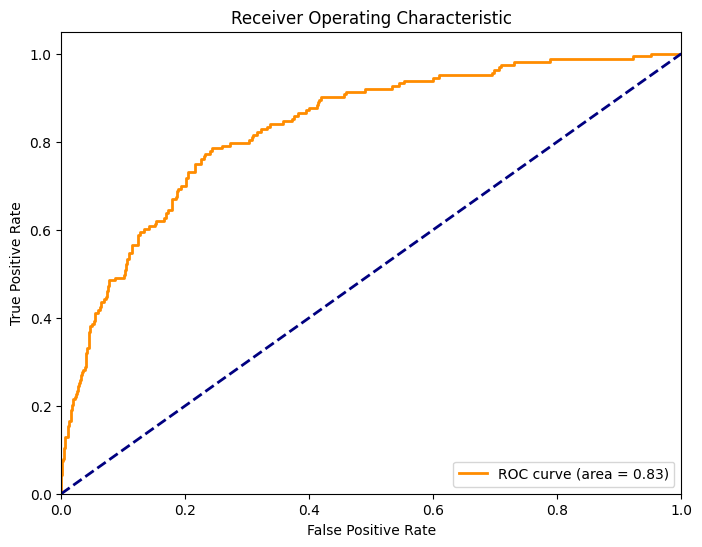

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

# Разделение данных на тренировочный и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

# Создание пайплайна для моделирования
model_pipeline = Pipeline(steps=[
    ('classifier', LogisticRegression())
])

# Обучение модели на тренировочных данных
model_pipeline.fit(X_train, y_train)

# Предсказание классов на тестовых данных
y_pred = model_pipeline.predict(X_test)

# Вывод полного отчета о классификации (precision, recall, F1-score)
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

# Вычисление и вывод матрицы ошибок (confusion matrix)
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

# Преобразование меток в числовой формат {0, 1}
y_test_numeric = y_test.replace({' False.': 0, ' True.': 1})

# Вычисление ROC-кривой и площади под ROC-кривой (AUC-ROC)
y_prob = model_pipeline.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test_numeric, y_prob)
roc_auc = roc_auc_score(y_test_numeric, y_prob)

# Построение ROC-кривой
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

TODO

Algorithms

from sklearn.neighbors import KNeighborsClassifier

from sklearn.svm import SVC

from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier

from sklearn.ensemble import AdaBoostClassifier

from sklearn.ensemble import GradientBoostingClassifier

from sklearn.neural_network import MLPClassifier

Использование gridsearch/randomsearch для настройки параметров
Оценка модели и выводы

Оценка с помощью метрик
from sklearn.metrics import accuracy_score, log_loss, classification_report, roc_auc_score, plot_roc_curve